In [1]:
import pandas as pd
import datetime
%matplotlib inline

In [3]:
data = pd.read_csv("/home/faizan/HDD1/EVI/CSV/Pak_crop_all_point_evi.csv")

In [4]:
dates = [datetime.datetime.strptime(str(i[]), "%Y%j") for i in data["DATE"]]
data.index = dates 

SyntaxError: invalid syntax (<ipython-input-4-b79cbe3c71ce>, line 1)

In [3]:
import os
os.remove("/home/faizan/Desktop/climate_data .tif")


In [11]:
for i in data["DATE"]:
    dates = [datetime.datetime.strptime(str(i), "%Y%j")]

    print dates
             

[datetime.datetime(2002, 1, 2, 0, 0)]
[datetime.datetime(2002, 1, 3, 0, 0)]
[datetime.datetime(2002, 1, 4, 0, 0)]
[datetime.datetime(2002, 1, 5, 0, 0)]
[datetime.datetime(2002, 1, 6, 0, 0)]
[datetime.datetime(2002, 1, 7, 0, 0)]
[datetime.datetime(2002, 1, 8, 0, 0)]
[datetime.datetime(2002, 1, 9, 0, 0)]
[datetime.datetime(2002, 1, 10, 0, 0)]
[datetime.datetime(2002, 1, 11, 0, 0)]
[datetime.datetime(2002, 1, 12, 0, 0)]
[datetime.datetime(2002, 1, 13, 0, 0)]
[datetime.datetime(2002, 1, 14, 0, 0)]
[datetime.datetime(2002, 1, 15, 0, 0)]
[datetime.datetime(2002, 1, 16, 0, 0)]
[datetime.datetime(2002, 1, 17, 0, 0)]
[datetime.datetime(2002, 1, 18, 0, 0)]
[datetime.datetime(2002, 1, 19, 0, 0)]
[datetime.datetime(2002, 1, 20, 0, 0)]
[datetime.datetime(2002, 1, 21, 0, 0)]
[datetime.datetime(2002, 1, 22, 0, 0)]
[datetime.datetime(2002, 1, 23, 0, 0)]
[datetime.datetime(2002, 1, 24, 0, 0)]
[datetime.datetime(2002, 1, 25, 0, 0)]
[datetime.datetime(2002, 1, 26, 0, 0)]
[datetime.datetime(2002, 1, 27, 0

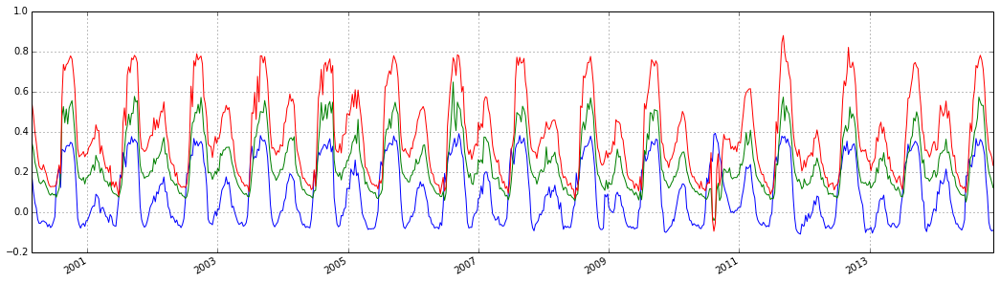

In [33]:
ndvi = data.NDVI
evi = data.EVI
lswi = data.LSWI
lswi.plot()
evi.plot()
ndvi.plot(figsize=(18,5))

In [30]:
date = "A2000097"
date[1:]

'2000097'

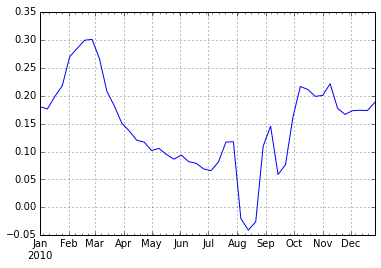

In [53]:
dummy = data[data.index.year > 2009]
evi = dummy.EVI[dummy.index.year < 2011]
evi.plot()

In [40]:
dummy

,sr.no,DATE,NDVI,EVI,LSWI,DVEL,Flood


In [58]:
data = pd.read_csv("/home/faizan/Desktop/output_indices.csv")
dummy = [result[1] for result in data]
print dummy


['r', 'A', 'D', 'V', 'S', 'V', 'l']


In [129]:
import pandas as pd
import csv

data = pd.read_csv("/home/faizan/USA_data/PALSAR/output/540backscatter27.csv", header=None) 

print data

for i in range(len(data)):
    data[3][i] = ["a"] 
print data

    if data[1][i] == "ALPSRP265290540":
        print "ok"
        data[3][i] = data[3][i]+"16/1/2011"
        
    elif data[1][i] == "ALPSRP245160540":
        data[3][i] = data[3][i]+"31/8/2010"
    else:
        data[3][i] = data[3][i]+",16/7/2010"

print data

"""
with open("/home/faizan/USA_data/PALSAR/output/540backscatter27.csv", 'r') as I:
    with open ("/home/faizan/USA_data/PALSAR/output/540backscatter27.csv", 'w') as O:
        writer = csv.writer(O)
        read= csv.reader(I)
print I

        for row in read:
            if row[0] =="ALPSRP265290540":
                print "OK"
                #writer.writerow(row+["16/1/2011"])
            elif row[0] == "ALPSRP245160540":
                print "OOK"
                #writer.writerow(row+["31/8/2010"])
            else:
                print "no"
                #writer.writerow(row+["16/7/2010"])
"""


    0                1          2
0  HH  ALPSRP238450540 -15.006526
1  HH  ALPSRP245160540 -18.847313
2  HH  ALPSRP265290540 -18.928465
3  HV  ALPSRP238450540 -33.285572
4  HV  ALPSRP245160540 -32.682522


KeyError: 3

In [2]:
for M in range(1,3):
    print M

1
2


In [7]:
# -*- coding: utf-8 -*-
# 2015.04.29 Faizan
# SVM


__author__ = 'Fazi'


from osgeo import gdal, osr
import numpy
import subprocess
from subprocess import PIPE, Popen
import os
import sys
sys.path.append('/usr/bin/')
import gdal_merge as gm
from multiprocessing import Pool
class MDimage(object):
    def __init__(self, filepath):
        self.filepath = filepath
        self.ds = gdal.Open(filepath, gdal.GA_ReadOnly)
        self.iminfo = dict()
        self.iminfo['bandnum'] = self.ds.RasterCount
        self.iminfo['cols'] = self.ds.RasterXSize
        self.iminfo['rows'] = self.ds.RasterYSize
        self.iminfo['originX'] = self.ds.GetGeoTransform()[0]
        self.iminfo['originY'] = self.ds.GetGeoTransform()[3]
        self.iminfo['pixelWidth'] = self.ds.GetGeoTransform()[1]
        self.iminfo['pixelHeight'] = self.ds.GetGeoTransform()[5]

class Index(MDimage):
    def __init__(self, filepath):
        self.filepath = filepath
        super(Index, self).__init__(filepath)

    def Band2Array(self,fill):
        cols = self.iminfo['cols']
        rows = self.iminfo['rows']
        band = self.ds.GetRasterBand(1)
        array = band.ReadAsArray(0, 0, cols, rows)
        #array = array.reshape(cols * rows)
        return array

    def FileCheckDel(self, filepath):
        if os.path.exists(filepath):
            os.remove(filepath)

    def ClipWithGdalwarp(self, infile, outfile, shape):
        self.FileCheckDel(outfile)
        layer = os.path.split(os.path.splitext(shape)[0])[1]
        command = ['gdalwarp', '-of', 'GTiff', '-cutline', shape, '-cl',\
                   layer, '-crop_to_cutline', infile, outfile]
        command = [comm.encode('utf-8') for comm in command]
        p = subprocess.Popen(command, \
                            stdin=PIPE, \
                            stdout=PIPE, \
                            stderr=PIPE)
        p.wait()
        print "stdout: %s" % (p.stdout.readlines(), )
        #print "Erros: %s" % (p.stderr.readlines(), )


    def MergeWithGdalwarp(self, infile, outfile):
        self.FileCheckDel(outfile)

        command = ['gdal_merge.py', '-o', outfile,'-n',
         infile[0], infile[1], infile[2], infile[3]]
        command = [comm.encode('utf-8') for comm in command]
        p = subprocess.Popen(command, \
                            stdin=PIPE, \
                            stdout=PIPE, \
                            stderr=PIPE)
        p.wait()
        #print "stdout: %s" % (p.stdout.readlines(), )
        #print "Erros: %s" % (p.stderr.readlines(), )

    def Merge(self, infile, outfile):
        sys.argv = [ infile[0], infile[1], infile[2], infile[3], '-o',outfile]
        gm.main()


"""

limage = Index("/home/faizan/HDD1/EVI/2005/MODIS.EVI.2005004.h23v06.tif")
A2001001.h23v06.Land_Cover_Type_2.uni
fill=-999
years=[2001, 2007]
shape="/home/faizan/Pakistan/pakistan shape file/PAK_adm0.shp"

files=[]
for n in range(len(years)):
    year=years[n]
    for i in range(1, 363):
        files=[]
        for V in range(5,7):
            for H in range(23,25):
                files.append("/home/faizan/HDD1/EVI/"+str(year)+"/MODIS.EVI.%d%03d"  % (year, i)+ ".h%dv%02d" % (H,V) + ".tif" )
        merge="/home/faizan/HDD1/EVI/"+str(year)+"/mosaic.%d%03d"  % (year, i) + ".tif"
        limage.MergeWithGdalwarp(files, merge)
        clip="/home/faizan/HDD1/EVI/"+str(year)+"/clip.%d%03d"  % (year, i) + ".tif"
        limage.ClipWithGdalwarp(merge, clip, shape)
"""
#/home/faizan/USA_data/8days/pak_lcd/A2001001.h23v06.Land_Cover_Type_2.uni

limage = Index("/home/faizan/USA_data/8days/pak_lcd/A2001001.h23v06.Land_Cover_Type_2.uni.tif")
fill=-999
years=[2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]
shape="/home/faizan/Pakistan/pakistan shape file/PAK_adm0.shp"

files=[]
for n in range(len(years)):
    year=years[n]
    for i in range(1, 2):
        files=[]
        for V in range(5,7):
            for H in range(23,25):
                files.append("/home/faizan/USA_data/8days/pak_lcd/A%d%03d"  % (year, i)+ ".h%dv%02d" % (H,V) + ".Land_Cover_Type_2.uni.tif" )
        merge="/home/faizan/USA_data/8days/pak_lcd/mosaic.%d%03d" % (year, i) + ".Type2.tif"
        limage.MergeWithGdalwarp(files, merge)
        clip="/home/faizan/USA_data/8days/pak_lcd/clip.%d%03d"  % (year, i) + ".Type2.tif"
        limage.ClipWithGdalwarp(merge, clip, shape)

stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []
stdout: []


In [11]:
limage.MergeWithGdalwarp(files, merge)



In [212]:
import pandas as pd
import csv
import datetime

data = pd.read_csv("/home/faizan/USA_data/PALSAR/output/540backscatter27.csv", header=None) 
data.columns = ["pol", "id", "bs"]

In [213]:
data

,pol,id,bs
0,HH,ALPSRP238450540,-15.006526
1,HH,ALPSRP245160540,-18.847313
2,HH,ALPSRP265290540,-18.928465
3,HV,ALPSRP238450540,-33.285572
4,HV,ALPSRP245160540,-32.682522


In [214]:
newcol = []
for i in data.index:
    if data["id"][i] == "ALPSRP265290540":
        newcol.append(datetime.datetime.strptime("16/1/2011", "%d/%m/%Y"))
    elif data["id"][i] == "ALPSRP245160540":
        newcol.append(datetime.datetime.strptime("31/8/2010", "%d/%m/%Y"))
    else:
        newcol.append(datetime.datetime.strptime("16/7/2010", "%d/%m/%Y"))

    
data["obs_date"] = newcol

In [215]:
data

,pol,id,bs,obs_date
0,HH,ALPSRP238450540,-15.006526,2010-07-16
1,HH,ALPSRP245160540,-18.847313,2010-08-31
2,HH,ALPSRP265290540,-18.928465,2011-01-16
3,HV,ALPSRP238450540,-33.285572,2010-07-16
4,HV,ALPSRP245160540,-32.682522,2010-08-31


In [216]:
data.index = [i for i in data["obs_date"]]

In [217]:
data

,pol,id,bs,obs_date
2010-07-16,HH,ALPSRP238450540,-15.006526,2010-07-16
2010-08-31,HH,ALPSRP245160540,-18.847313,2010-08-31
2011-01-16,HH,ALPSRP265290540,-18.928465,2011-01-16
2010-07-16,HV,ALPSRP238450540,-33.285572,2010-07-16
2010-08-31,HV,ALPSRP245160540,-32.682522,2010-08-31


In [218]:
data.columns

Index([u'pol', u'id', u'bs', u'obs_date'], dtype='object')

In [222]:
data




,pol,id,bs,obs_date
2010-07-16,HH,ALPSRP238450540,-15.006526,2010-07-16
2010-08-31,HH,ALPSRP245160540,-18.847313,2010-08-31
2011-01-16,HH,ALPSRP265290540,-18.928465,2011-01-16
2010-07-16,HV,ALPSRP238450540,-33.285572,2010-07-16
2010-08-31,HV,ALPSRP245160540,-32.682522,2010-08-31


In [223]:
data


,pol,id,bs,obs_date
2010-07-16,HH,ALPSRP238450540,-15.006526,2010-07-16
2010-08-31,HH,ALPSRP245160540,-18.847313,2010-08-31
2011-01-16,HH,ALPSRP265290540,-18.928465,2011-01-16
2010-07-16,HV,ALPSRP238450540,-33.285572,2010-07-16
2010-08-31,HV,ALPSRP245160540,-32.682522,2010-08-31


In [225]:
data.to_csv("/home/faizan/USA_data/PALSAR/output/540backscatter27.csv")



In [228]:
import pandas as pd
import csv
import datetime

data = pd.read_csv("/home/faizan/USA_data/PALSAR/output/540backscatter27.csv") 
data

,Unnamed: 0,0,1,2,3
0,0,HH,ALPSRP238450540,-15.006526,2010-07-16 00:00:00
1,1,HH,ALPSRP245160540,-18.847313,2010-08-31 00:00:00
2,2,HH,ALPSRP265290540,-18.928465,2011-01-16 00:00:00
3,3,HV,ALPSRP238450540,-33.285572,2010-07-16 00:00:00
4,4,HV,ALPSRP245160540,-32.682522,2010-08-31 00:00:00


In [229]:
data["3"]

0    2010-07-16 00:00:00
1    2010-08-31 00:00:00
2    2011-01-16 00:00:00
3    2010-07-16 00:00:00
4    2010-08-31 00:00:00
Name: 3, dtype: object

In [236]:
import Image

#opens an image:
im = Image.open("/home/faizan/USA_data/graphs/Pak_far_pt_08.png")
#creates a new empty image, RGB mode, and size 400 by 400.
new_im = Image.new('RGB', (6400,5000))

#Here I resize my opened image, so it is no bigger than 100,100
im.thumbnail((800,500))
#Iterate through a 4 by 4 grid with 100 spacing, to place my image
for i in xrange(0,6400,800):
    for j in xrange(0,5000,500):
        #I change brightness of the images, just to emphasise they are unique copies.
                #paste the image at location i,j:
        new_im.paste(im, (i,j))

new_im.save("/home/faizan/Desktop/111.png")

In [263]:
import Image

#opens an image:

new_im = Image.new('RGB', (5220,3150))

#Here I resize my opened image, so it is no bigger than 100,100
#im.thumbnail((800,500))
#Iterate through a 4 by 4 grid with 100 spacing, to place my image
n = 0
for i in xrange(0,5220,580):
    for j in xrange(0,3150,350):
           
        im = Image.open("/home/faizan/USA_data/graphs/Pak_near_pt_%02d.png" % n)
#creates a new empty image, RGB mode, and size 400 by 400.
        #I change brightness of the images, just to emphasise they are unique copies.
                #paste the image at location i,j:
        new_im.paste(im, (i,j))
        n += 1
        if n==80:
            break 
new_im.save("/home/faizan/Desktop/Pak_near.png")